In [1]:
%cd "drive/My Drive/deep/HW5"

/content/drive/My Drive/deep/HW5


In [2]:
# imports:
import cv2
import os
import numpy as np
import math
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
import torchvision.models as models
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import skimage
from numpy import cov
from numpy import iscomplexobj
from numpy import trace
from tqdm import tqdm
from scipy import linalg

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

# Data Prepration

In [4]:
def data_prepration(videos_path):
    videos = os.listdir(videos_path)
    for index , video in enumerate(videos):
        vidcap = cv2.VideoCapture("videos/" + video)
        success,image = vidcap.read()
        count = 0
        i = 0
        while i < 10:
            if count%15 == 0 :
                    cv2.imwrite("dataset/frame%d_%d.jpg" % (count , index) , image)
                    i+=1

            success,image = vidcap.read()
            count += 1

In [ ]:
data_prepration('videos')

# Preprocessing

In [5]:
def PreProcessing(path):
    my_dataset = []
    images = os.listdir(path)
    for image in images:

        image = cv2.imread(path+"/"+image)
        image = cv2.resize(image, (224 , 224))

        blured_image = cv2.GaussianBlur(image,(5,5),1,1)
        edge = cv2.Canny(blured_image ,100,200)
        edge = torch.Tensor(edge).unsqueeze(0)
        edge = 255 - edge
        
        image = skimage.img_as_float(image)
        image =  torch.from_numpy(image).permute(2,0,1)
        
        my_dataset.append((image , edge))
    return my_dataset

In [6]:
dataset = PreProcessing('dataset')

In [7]:
X_train , X_test = train_test_split(dataset ,test_size = 30 )

In [8]:
BATCH_SIZE = 8
train_loader = torch.utils.data.DataLoader(dataset=X_train, batch_size=BATCH_SIZE , shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=X_test, batch_size=BATCH_SIZE)

# Image Colorization

In [9]:
class Discriminator(nn.Module):
    def __init__(self, in_channels = 3, use_sigmoid=True, use_spectral_norm=True,gpu_ids = []):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True)
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(128,256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1, inplace=True)
        )

        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1, inplace=True)
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1, inplace=True)
        )
        self.conv6 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1, inplace=True)
        )

        self.conv7 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1, inplace=True)
        )

        self.conv8 = nn.Conv2d(in_channels=512, out_channels=1, kernel_size=1, stride=1, padding=0)
        self._initialize_weights()


    def forward(self, x):
        #print("main" , x.shape)
        x = self.conv1(x)
        #print("1", x.shape)
        x = self.conv2(x)
        #print("2",x.shape)
        x = self.conv3(x)
        #print("3",x.shape)

        x = self.conv4(x)
        #print("4",x.shape)

        x = self.conv5(x)
        #print("5",x.shape)

        x= self.conv6(x)
        #print("6",x.shape)
        
        x= self.conv7(x)
        #print("7",x.shape)

        x= self.conv8(x)
        #print("8",x.shape)
        x = torch.sigmoid(x)
        return x


    def _initialize_weights(self):
        for module in self.modules():
            if type(module) in { nn.Conv2d, nn.ConvTranspose2d}:
                torch.nn.init.xavier_normal_(module.weight)
                torch.nn.init.zeros_(module.bias)

In [10]:
class Generator(nn.Module):
    def __init__(self, residual_blocks=0):
        super(Generator, self).__init__()

        self.conv1 = nn.Conv2d(4, 64, 3, stride=2, padding=1)
        self.B1 = nn.BatchNorm2d(64)
        self.relu1 = nn.LeakyReLU(0.1)

        self.conv2 = nn.Conv2d( 64, 128, 3, stride=2, padding=1)
        self.B2 = nn.BatchNorm2d(128)
        self.relu2 = nn.LeakyReLU(0.1)

        self.conv3 = nn.Conv2d(128, 256, 3, stride=2, padding=1)
        self.B3 = nn.BatchNorm2d(256)
        self.relu3 = nn.LeakyReLU(0.1)

        self.conv4 = nn.Conv2d(256, 512, 3, stride=2, padding=1)
        self.B4 = nn.BatchNorm2d(512)
        self.relu4 = nn.LeakyReLU(0.1)

        self.conv5 = nn.Conv2d(512, 512, 3, stride=2, padding=1)
        self.B5 = nn.BatchNorm2d(512)
        self.relu5 = nn.LeakyReLU(0.1)

        self.convT6 = nn.ConvTranspose2d( 512, 512, 3, stride=2, padding=1, output_padding=1)
        self.B6 = nn.BatchNorm2d(512)
        self.relu6 = nn.ReLU()

        self.convT7 = nn.ConvTranspose2d(512, 256, 3, stride=2, padding=1, output_padding=1)
        self.B7 = nn.BatchNorm2d(256)
        self.relu7 = nn.ReLU()

        self.convT8 = nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1)
        self.B8 = nn.BatchNorm2d(128)
        self.relu8 = nn.ReLU()

        self.convT9 = nn.ConvTranspose2d( 128, 64, 3, stride=2, padding=1, output_padding=1)
        self.B9 = nn.BatchNorm2d(64)
        self.relu9 = nn.ReLU()

        self.convT10 = nn.ConvTranspose2d(64, 3, 3, stride=2, padding=1, output_padding=1)
        self.B10 = nn.BatchNorm2d(3)
        self.relu10 = nn.ReLU()

        self._initialize_weights()

    def forward(self, x):
        
        x = self.relu1(self.B1(self.conv1(x)))
        short_cut1 = x
        
        x = self.relu2(self.B2(self.conv2(x)))
        short_cut2 = x

        x = self.relu3(self.B3(self.conv3(x)))
        short_cut3 = x

        x = self.relu4(self.B4(self.conv4(x)))
        short_cut4 = x

        x = self.relu5(self.B5(self.conv5(x)))

        x = self.relu6(self.B6(self.convT6(x)))
        #print(x.shape , short_cut4.shape)

        x = x + short_cut4
        
        x = self.relu7(self.B7(self.convT7(x)))
        #print(x.shape , short_cut3.shape)
        x = x + short_cut3

        x = self.relu8(self.B8(self.convT8(x)))
        #print(x.shape , short_cut2.shape)

        x = x + short_cut2

        x = self.relu9(self.B9(self.convT9(x)))
        x = x + short_cut1

        x = self.relu10(self.B10(self.convT10(x)))

        x = torch.tanh(x)

        return x

    def _initialize_weights(self):
        for module in self.modules():
            if type(module) in { nn.Conv2d, nn.ConvTranspose2d}:
                torch.nn.init.xavier_normal_(module.weight)
                torch.nn.init.zeros_(module.bias)

In [11]:
discriminator = Discriminator().to(device)
generator = Generator().to(device)

LEARNING_RATE_D = 1e-3
LEARNING_RATE_G = 1e-3

opt_D = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE_D)
opt_G = optim.Adam(generator.parameters(), lr=LEARNING_RATE_G  )

L1Loss = torch.nn.L1Loss().to(device)


epoch: 0 	 last batch loss D: 1.982655644416809 	 last batch loss G: 298.4673156738281


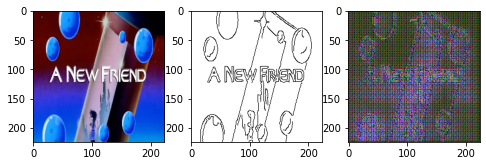

epoch: 1 	 last batch loss D: 1.4012771844863892 	 last batch loss G: 419.4298095703125


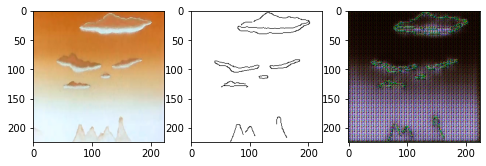

epoch: 2 	 last batch loss D: 1.5896965265274048 	 last batch loss G: 296.0638427734375


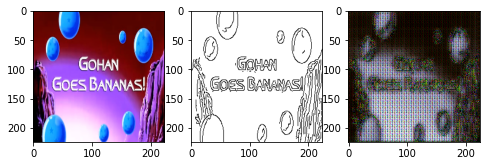

epoch: 3 	 last batch loss D: 1.3922444581985474 	 last batch loss G: 188.29673767089844


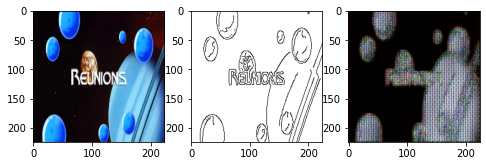

epoch: 4 	 last batch loss D: 1.3906972408294678 	 last batch loss G: 350.1697998046875


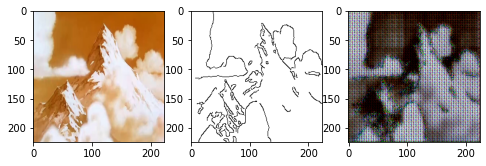

epoch: 5 	 last batch loss D: 1.3877259492874146 	 last batch loss G: 275.9632873535156


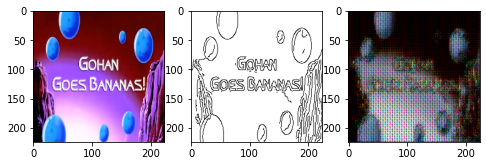

epoch: 6 	 last batch loss D: 1.437163233757019 	 last batch loss G: 260.1888122558594


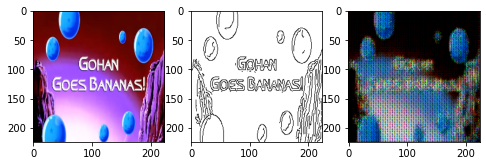

epoch: 7 	 last batch loss D: 1.4171696901321411 	 last batch loss G: 173.36329650878906


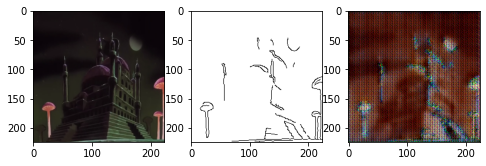

epoch: 8 	 last batch loss D: 1.4280351400375366 	 last batch loss G: 339.2707824707031


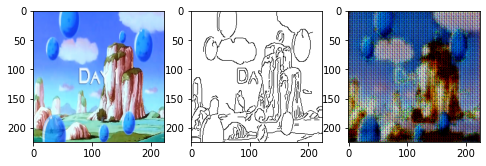

epoch: 9 	 last batch loss D: 1.3598158359527588 	 last batch loss G: 312.2925720214844


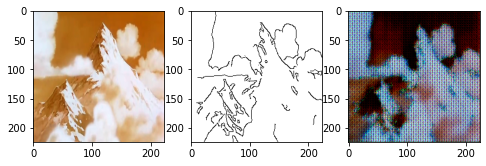

epoch: 10 	 last batch loss D: 1.3910763263702393 	 last batch loss G: 156.91371154785156


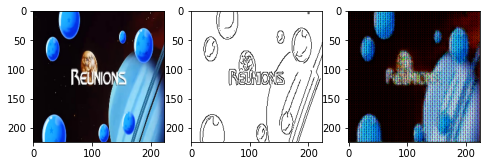

epoch: 11 	 last batch loss D: 1.3896371126174927 	 last batch loss G: 126.13007354736328


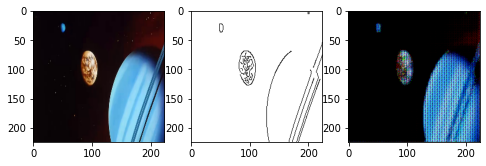

epoch: 12 	 last batch loss D: 1.3967787027359009 	 last batch loss G: 224.7740936279297


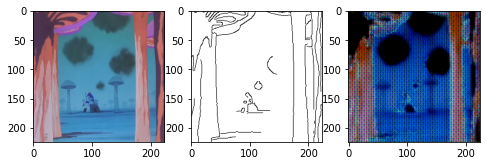

epoch: 13 	 last batch loss D: 1.3712592124938965 	 last batch loss G: 172.38645935058594


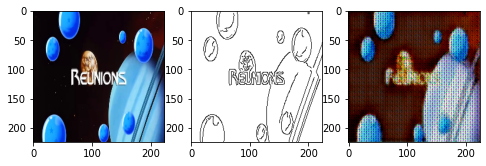

epoch: 14 	 last batch loss D: 1.5131869316101074 	 last batch loss G: 235.7069091796875


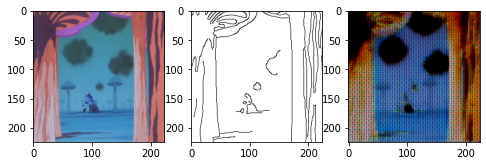

epoch: 15 	 last batch loss D: 1.4015839099884033 	 last batch loss G: 208.14710998535156


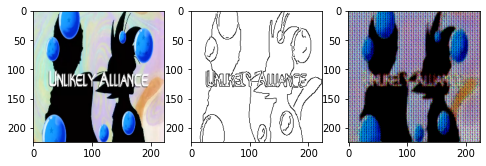

epoch: 16 	 last batch loss D: 1.391930103302002 	 last batch loss G: 211.31137084960938


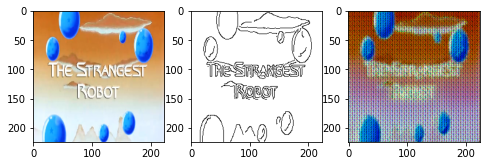

epoch: 17 	 last batch loss D: 1.3897210359573364 	 last batch loss G: 141.18545532226562


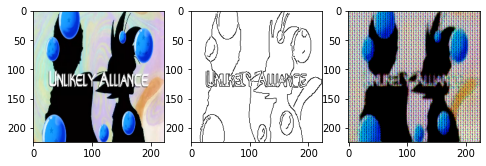

epoch: 18 	 last batch loss D: 1.3993524312973022 	 last batch loss G: 192.65333557128906


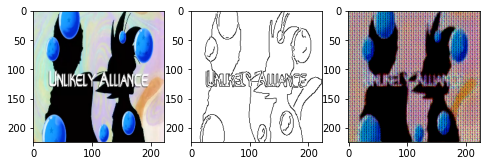

epoch: 19 	 last batch loss D: 1.3861470222473145 	 last batch loss G: 185.1724853515625


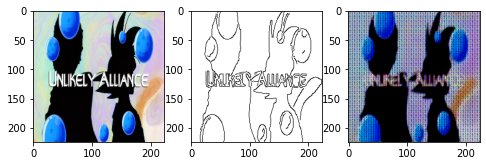

epoch: 20 	 last batch loss D: 1.3985661268234253 	 last batch loss G: 231.58221435546875


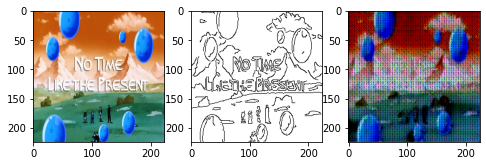

epoch: 21 	 last batch loss D: 1.3875939846038818 	 last batch loss G: 254.63458251953125


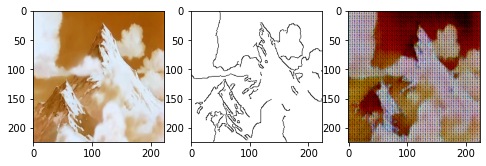

epoch: 22 	 last batch loss D: 1.451709508895874 	 last batch loss G: 166.2678680419922


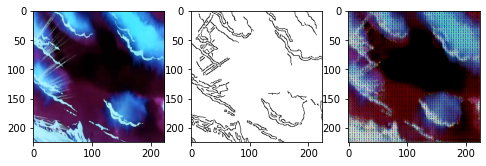

epoch: 23 	 last batch loss D: 1.615644931793213 	 last batch loss G: 131.560546875


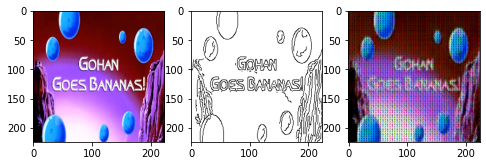

epoch: 24 	 last batch loss D: 1.4489657878875732 	 last batch loss G: 145.5457305908203


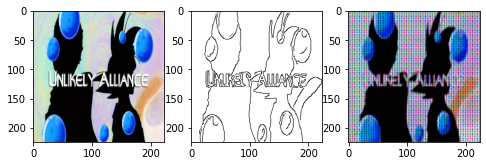

epoch: 25 	 last batch loss D: 1.511960506439209 	 last batch loss G: 155.36575317382812


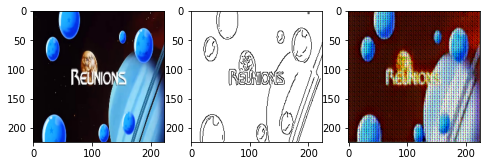

epoch: 26 	 last batch loss D: 1.4069194793701172 	 last batch loss G: 117.84500885009766


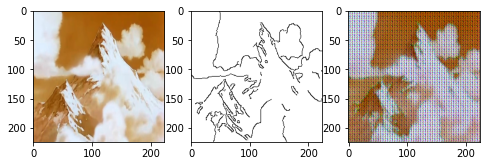

epoch: 27 	 last batch loss D: 1.4040966033935547 	 last batch loss G: 185.65798950195312


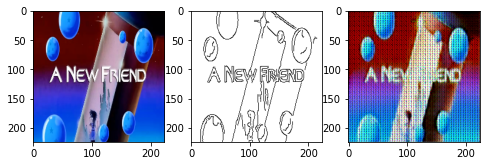

epoch: 28 	 last batch loss D: 1.4229097366333008 	 last batch loss G: 119.55707550048828


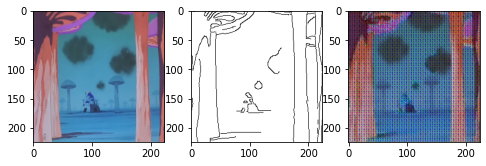

epoch: 29 	 last batch loss D: 1.3898922204971313 	 last batch loss G: 131.1722869873047


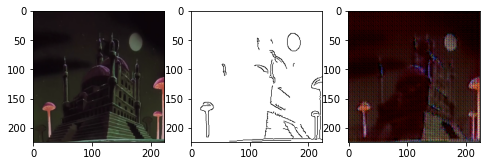

epoch: 30 	 last batch loss D: 1.543209195137024 	 last batch loss G: 180.42990112304688


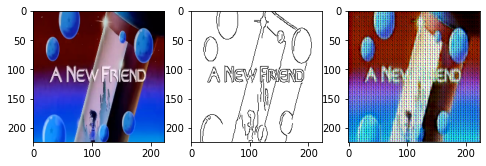

epoch: 31 	 last batch loss D: 1.4796617031097412 	 last batch loss G: 288.1357421875


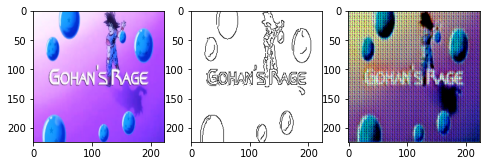

epoch: 32 	 last batch loss D: 1.4055771827697754 	 last batch loss G: 123.49436950683594


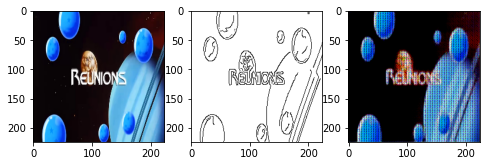

epoch: 33 	 last batch loss D: 1.391016960144043 	 last batch loss G: 135.82679748535156


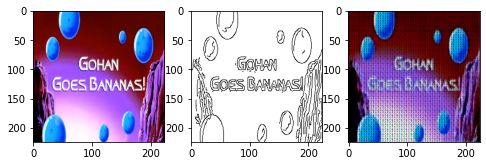

epoch: 34 	 last batch loss D: 1.4375286102294922 	 last batch loss G: 160.54656982421875


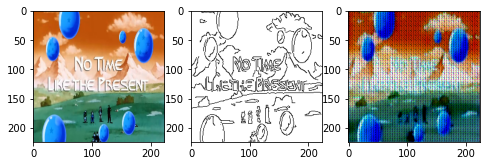

epoch: 35 	 last batch loss D: 1.475350260734558 	 last batch loss G: 159.73887634277344


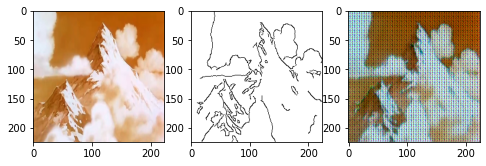

epoch: 36 	 last batch loss D: 1.387159824371338 	 last batch loss G: 156.81993103027344


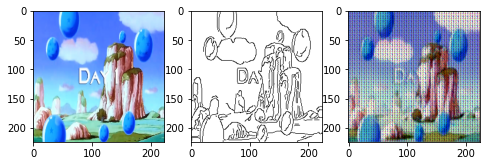

epoch: 37 	 last batch loss D: 1.389711618423462 	 last batch loss G: 137.7362060546875


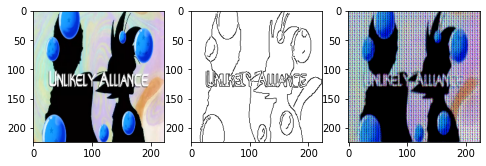

epoch: 38 	 last batch loss D: 1.3935809135437012 	 last batch loss G: 134.08688354492188


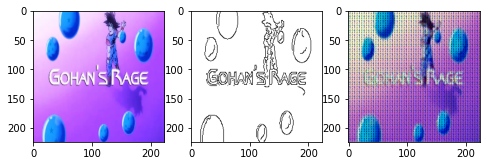

epoch: 39 	 last batch loss D: 1.3956378698349 	 last batch loss G: 184.4517822265625


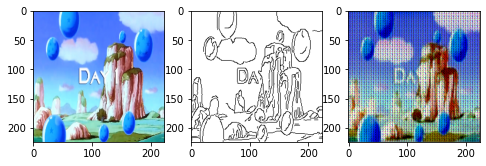

epoch: 40 	 last batch loss D: 1.4088988304138184 	 last batch loss G: 265.670166015625


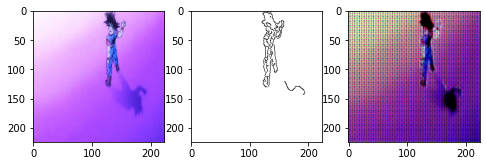

epoch: 41 	 last batch loss D: 1.4321308135986328 	 last batch loss G: 192.65785217285156


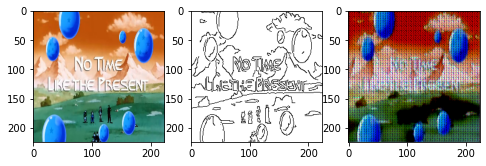

epoch: 42 	 last batch loss D: 1.3917865753173828 	 last batch loss G: 236.53469848632812


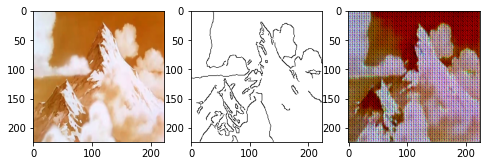

epoch: 43 	 last batch loss D: 1.3874483108520508 	 last batch loss G: 202.14663696289062


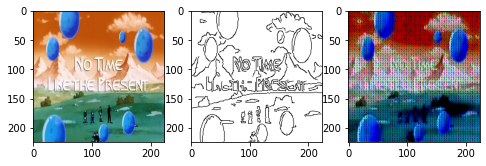

epoch: 44 	 last batch loss D: 1.387453556060791 	 last batch loss G: 246.96917724609375


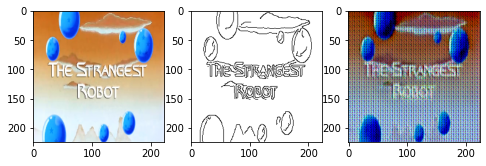

epoch: 45 	 last batch loss D: 1.392197608947754 	 last batch loss G: 116.18041229248047


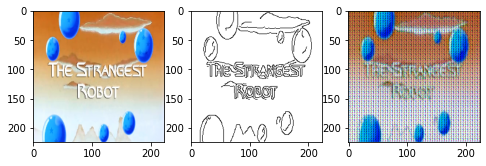

epoch: 46 	 last batch loss D: 1.3960846662521362 	 last batch loss G: 230.30136108398438


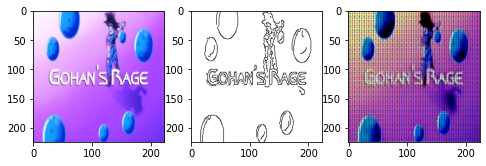

epoch: 47 	 last batch loss D: 1.4056700468063354 	 last batch loss G: 109.80192565917969


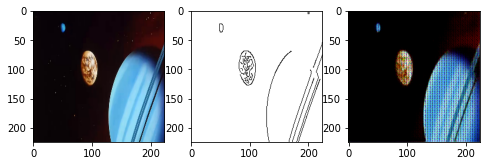

epoch: 48 	 last batch loss D: 1.3956865072250366 	 last batch loss G: 121.1209945678711


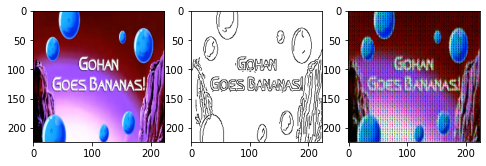

epoch: 49 	 last batch loss D: 1.393965721130371 	 last batch loss G: 133.57997131347656


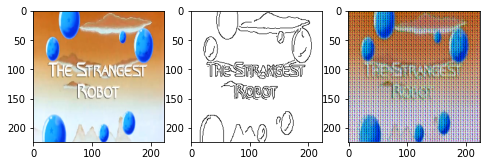

epoch: 50 	 last batch loss D: 1.3987759351730347 	 last batch loss G: 186.6503143310547


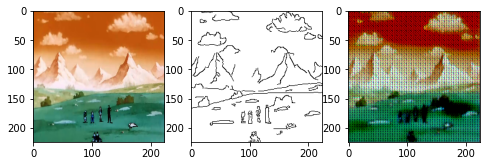

epoch: 51 	 last batch loss D: 1.400920033454895 	 last batch loss G: 158.71212768554688


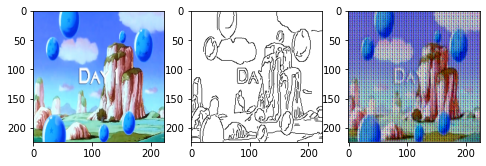

epoch: 52 	 last batch loss D: 1.3895647525787354 	 last batch loss G: 157.88746643066406


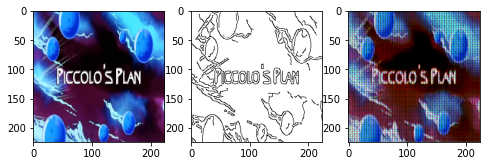

epoch: 53 	 last batch loss D: 1.387100338935852 	 last batch loss G: 122.60810852050781


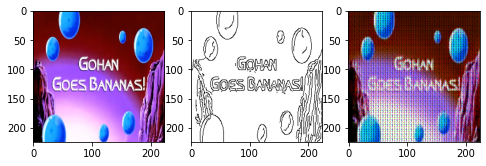

epoch: 54 	 last batch loss D: 1.3921159505844116 	 last batch loss G: 194.65318298339844


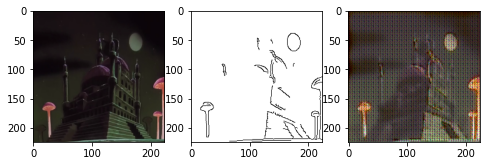

epoch: 55 	 last batch loss D: 1.4084784984588623 	 last batch loss G: 132.51739501953125


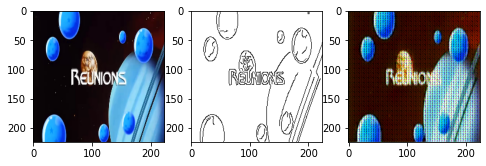

epoch: 56 	 last batch loss D: 1.4006690979003906 	 last batch loss G: 117.0062255859375


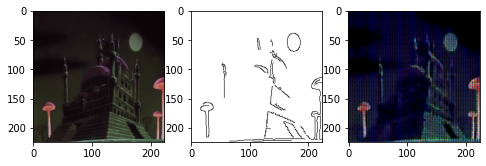

epoch: 57 	 last batch loss D: 1.386614441871643 	 last batch loss G: 115.837890625


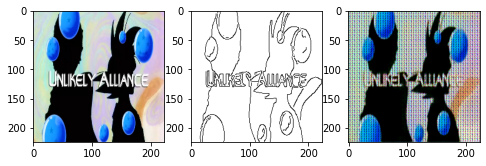

epoch: 58 	 last batch loss D: 1.3870584964752197 	 last batch loss G: 118.53208923339844


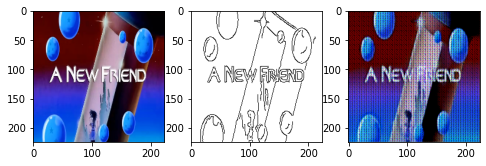

epoch: 59 	 last batch loss D: 1.3866063356399536 	 last batch loss G: 115.23529052734375


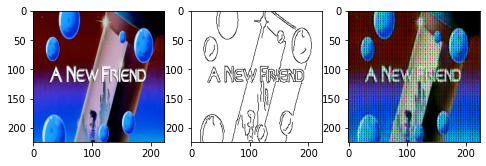

epoch: 60 	 last batch loss D: 1.4042823314666748 	 last batch loss G: 193.0629425048828


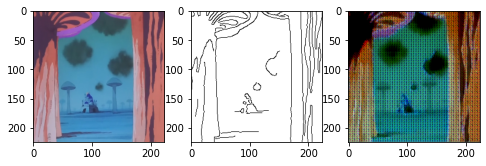

epoch: 61 	 last batch loss D: 1.3923934698104858 	 last batch loss G: 109.47657775878906


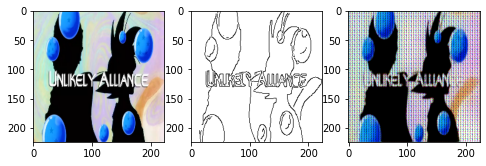

epoch: 62 	 last batch loss D: 1.393707513809204 	 last batch loss G: 95.18592834472656


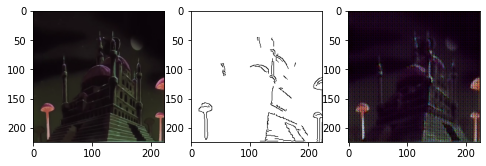

epoch: 63 	 last batch loss D: 1.4100208282470703 	 last batch loss G: 164.4271240234375


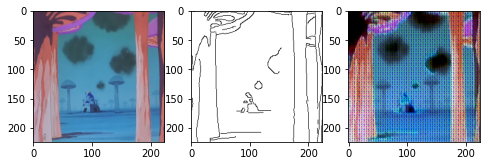

epoch: 64 	 last batch loss D: 1.4066133499145508 	 last batch loss G: 265.7206726074219


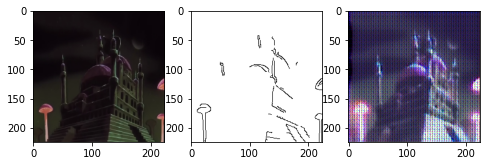

epoch: 65 	 last batch loss D: 1.4122004508972168 	 last batch loss G: 224.95706176757812


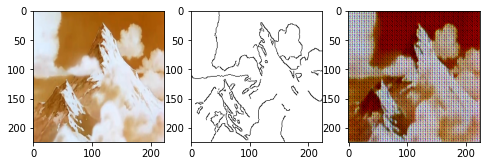

epoch: 66 	 last batch loss D: 1.3861374855041504 	 last batch loss G: 129.04837036132812


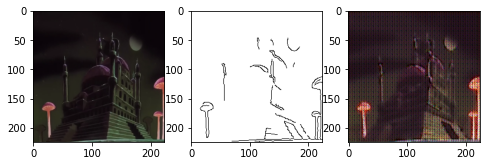

epoch: 67 	 last batch loss D: 1.3865461349487305 	 last batch loss G: 140.31875610351562


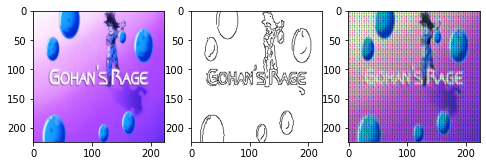

epoch: 68 	 last batch loss D: 1.3978893756866455 	 last batch loss G: 146.75534057617188


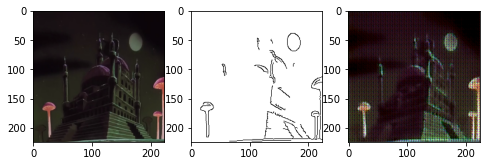

epoch: 69 	 last batch loss D: 1.3866243362426758 	 last batch loss G: 136.6708526611328


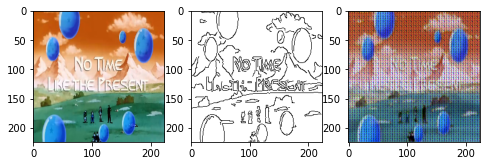

epoch: 70 	 last batch loss D: 1.3847452402114868 	 last batch loss G: 128.59109497070312


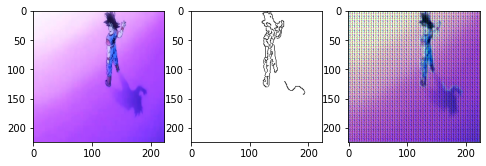

epoch: 71 	 last batch loss D: 1.3890938758850098 	 last batch loss G: 199.52044677734375


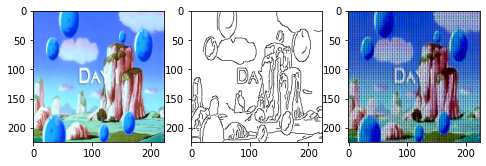

epoch: 72 	 last batch loss D: 1.387336015701294 	 last batch loss G: 119.07756042480469


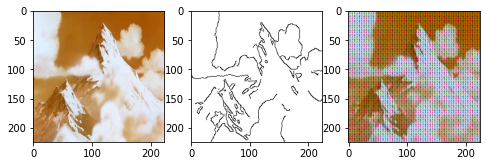

epoch: 73 	 last batch loss D: 1.4064316749572754 	 last batch loss G: 103.23580169677734


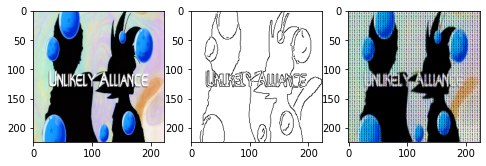

epoch: 74 	 last batch loss D: 1.3886747360229492 	 last batch loss G: 116.08824920654297


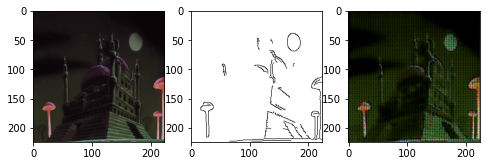

epoch: 75 	 last batch loss D: 1.3912734985351562 	 last batch loss G: 111.27110290527344


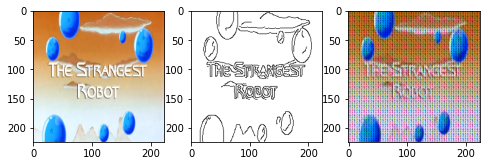

epoch: 76 	 last batch loss D: 1.3866610527038574 	 last batch loss G: 114.99099731445312


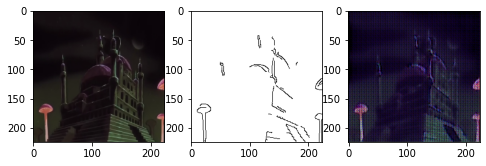

epoch: 77 	 last batch loss D: 1.4510074853897095 	 last batch loss G: 161.6555938720703


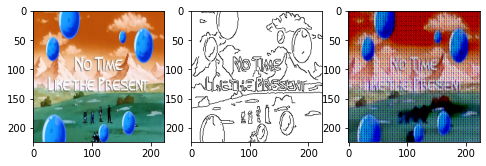

epoch: 78 	 last batch loss D: 1.3887830972671509 	 last batch loss G: 199.7320556640625


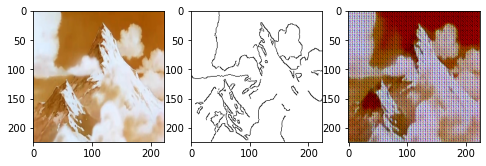

epoch: 79 	 last batch loss D: 1.3923954963684082 	 last batch loss G: 116.92726135253906


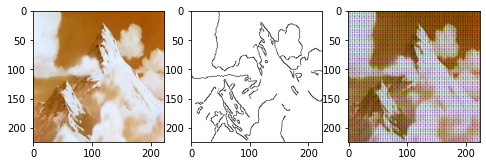

epoch: 80 	 last batch loss D: 1.4307407140731812 	 last batch loss G: 114.6835708618164


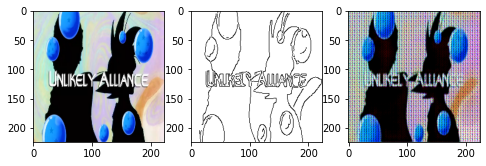

epoch: 81 	 last batch loss D: 1.3905534744262695 	 last batch loss G: 126.8250503540039


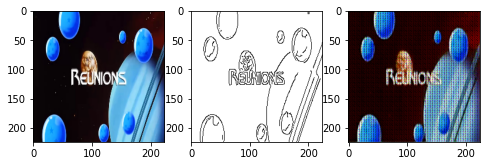

epoch: 82 	 last batch loss D: 1.4027098417282104 	 last batch loss G: 231.6250762939453


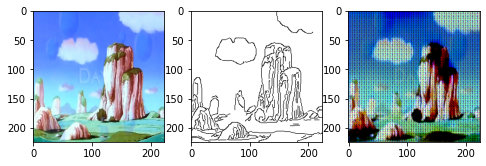

epoch: 83 	 last batch loss D: 1.3872438669204712 	 last batch loss G: 102.12678527832031


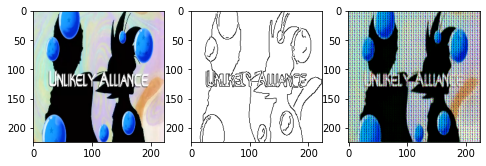

epoch: 84 	 last batch loss D: 1.388300895690918 	 last batch loss G: 131.91409301757812


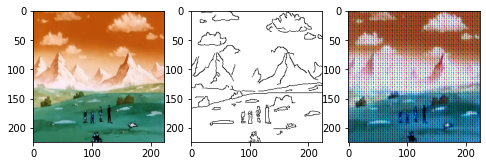

epoch: 85 	 last batch loss D: 1.390474557876587 	 last batch loss G: 128.25912475585938


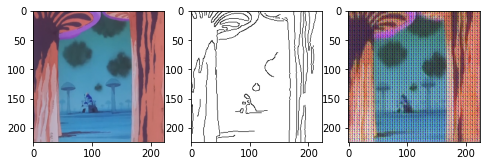

epoch: 86 	 last batch loss D: 1.3866856098175049 	 last batch loss G: 221.4158477783203


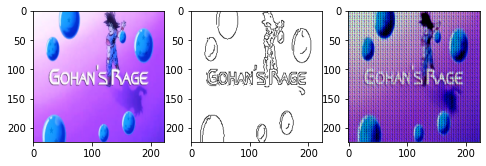

epoch: 87 	 last batch loss D: 1.5557277202606201 	 last batch loss G: 159.17433166503906


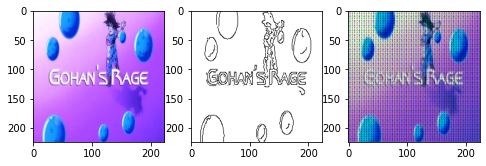

epoch: 88 	 last batch loss D: 1.3916155099868774 	 last batch loss G: 203.7259521484375


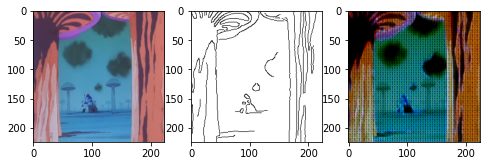

epoch: 89 	 last batch loss D: 1.3863356113433838 	 last batch loss G: 93.19820404052734


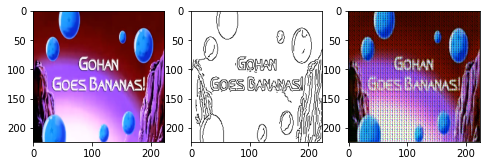

epoch: 90 	 last batch loss D: 1.4215632677078247 	 last batch loss G: 185.7052764892578


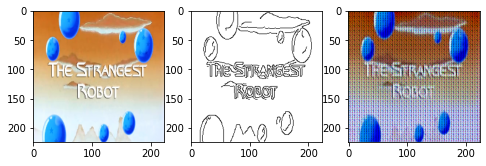

epoch: 91 	 last batch loss D: 1.3864727020263672 	 last batch loss G: 134.13360595703125


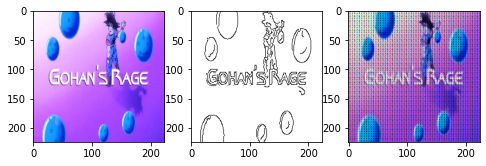

epoch: 92 	 last batch loss D: 1.4058918952941895 	 last batch loss G: 104.97254180908203


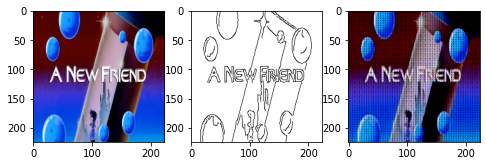

epoch: 93 	 last batch loss D: 1.3873558044433594 	 last batch loss G: 99.2869873046875


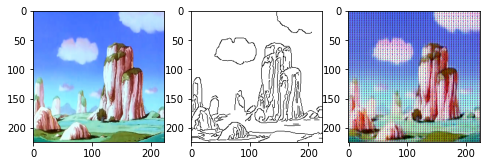

epoch: 94 	 last batch loss D: 1.4051533937454224 	 last batch loss G: 93.81271362304688


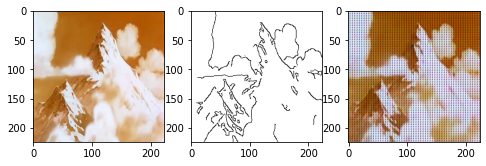

epoch: 95 	 last batch loss D: 1.390058994293213 	 last batch loss G: 153.6515350341797


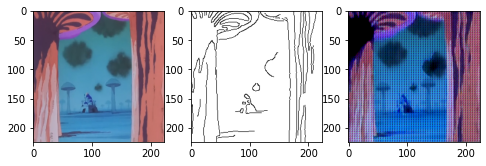

epoch: 96 	 last batch loss D: 1.4175877571105957 	 last batch loss G: 130.98199462890625


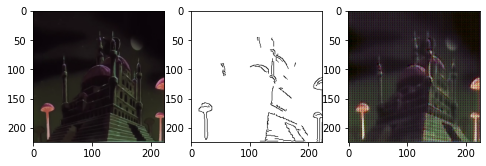

epoch: 97 	 last batch loss D: 1.3944607973098755 	 last batch loss G: 106.49275207519531


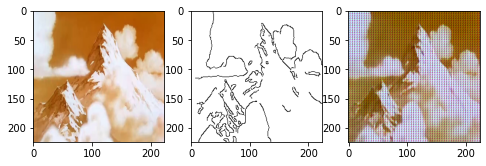

epoch: 98 	 last batch loss D: 1.4212491512298584 	 last batch loss G: 117.67948150634766


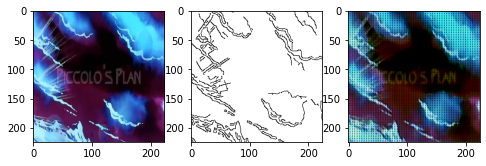

epoch: 99 	 last batch loss D: 1.3767622709274292 	 last batch loss G: 94.78380584716797


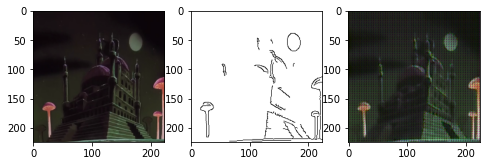

In [12]:
N_EPOCH = 100
for epoch in range(N_EPOCH):
    for i, (real_img, label) in enumerate(train_loader):
        
        real_img = real_img.float().to(device)
        label = label.to(device)
        fake_labels = torch.zeros(real_img.shape[0]).cuda()
        real_labels = torch.ones(real_img.shape[0]).cuda()
        ############ Train Discriminator #############
        cat = torch.cat([real_img , label] , 1)
        fake_img = generator(cat)
        
        opt_D.zero_grad()

        real_pred = torch.squeeze(discriminator(real_img))
        fake_pred = torch.squeeze(discriminator(fake_img))

        loss_d1 = nn.BCELoss()(real_pred, real_labels)
        loss_d2 = nn.BCELoss()(fake_pred, fake_labels)

        loss_d = loss_d1 + loss_d2

        loss_d.backward()
        opt_D.step()
        ########### Train Generator ##############
        fake_img = generator(cat)
        fake_pred = torch.squeeze(discriminator(fake_img).squeeze(1).squeeze(2))

        opt_G.zero_grad()

        loss_g1 =  nn.BCELoss()(fake_pred, real_labels)
        loss_L1 =  L1Loss(fake_img.view(fake_img.size(0),-1) , real_img.view(real_img.size(0),-1))
        loss_g = loss_g1 + 1000 * loss_L1
        loss_g.backward()
        opt_G.step()
        #########################

    print("epoch: {} \t last batch loss D: {} \t last batch loss G: {}".format(epoch, loss_d.item(), loss_g.item()))
    
    fig , (ax1 , ax2 , ax3) = plt.subplots(1,3 , figsize = (8,8))

    ax1.imshow(real_img[0].permute(1,2,0).cpu())
    ax2.imshow(label[0].squeeze(0).cpu().numpy() , cmap='gray')
    ax3.imshow(fake_img[0].permute(1,2,0).cpu().detach().numpy())
    plt.show()

# Test

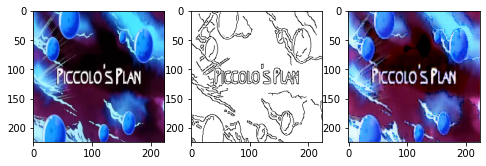

In [ ]:
main_images = []
generated_images = []
for i, (real_img, label) in enumerate(test_loader):
    real_img = real_img.float().to(device)
    label = label.to(device)
    main_images.append(real_img)    
    fake_labels = torch.zeros(real_img.shape[0]).cuda()
    real_labels = torch.ones(real_img.shape[0]).cuda()
    ############ Train Discriminator #############
    cat = torch.cat([real_img , label] , 1)
    fake_img = generator(cat)
    generated_images.append(fake_img)
fig , (ax1 , ax2 , ax3) = plt.subplots(1,3 , figsize = (8,8))

ax1.imshow(real_img[0].permute(1,2,0).cpu())
ax2.imshow(label[0].squeeze(0).cpu().numpy() , cmap='gray')
ax3.imshow(fake_img[0].permute(1,2,0).cpu().detach().numpy())
plt.show()

In [41]:
def data_prepration(videos_path):
    videos = os.listdir(videos_path)
    for index , video in enumerate(videos):
        vidcap = cv2.VideoCapture("test/" + video)
        success,image = vidcap.read()
        count = 0
        i = 0
        while i < 120:
            if count%2 == 0 :
                    cv2.imwrite("test_dataset/frame%d_%d.jpg" % (count , index) , image)
                    i+=1

            success,image = vidcap.read()
            count += 1

In [42]:
data_prepration('test')

In [43]:
X_test = PreProcessing('test_dataset')

In [44]:
test_loader = torch.utils.data.DataLoader(dataset=X_test, batch_size=BATCH_SIZE)

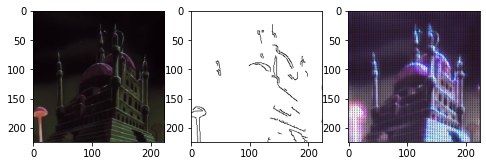

In [45]:
main_images = []
generated_images = []
for i, (real_img, label) in enumerate(test_loader):
    real_img = real_img.float().to(device)
    label = label.to(device)
    main_images.append(real_img)    
    fake_labels = torch.zeros(real_img.shape[0]).cuda()
    real_labels = torch.ones(real_img.shape[0]).cuda()
    ############ Train Discriminator #############
    cat = torch.cat([real_img , label] , 1)
    fake_img = generator(cat)
    generated_images.append(fake_img)
fig , (ax1 , ax2 , ax3) = plt.subplots(1,3 , figsize = (8,8))

ax1.imshow(real_img[0].permute(1,2,0).cpu())
ax2.imshow(label[0].squeeze(0).cpu().numpy() , cmap='gray')
ax3.imshow(fake_img[0].permute(1,2,0).cpu().detach().numpy())
plt.show()

# Video Colorization

In [46]:
frame_num = 0
dataset = []
for batch in generated_images:
    for image in batch:
        arr = image.permute(1,2,0).cpu().detach().numpy()
        im = ((arr - arr.min()) * (1/(arr.max() - arr.min()) * 255)).astype('uint8')
        dataset.append(im)

In [47]:
from cv2 import VideoWriter, VideoWriter_fourcc

In [48]:
fourcc = VideoWriter_fourcc(*'MP42')
FPS = 24
out = VideoWriter('./video3.avi', fourcc, float(FPS), (224, 224))

for i in range(len(dataset)):
    out.write(dataset[i])
out.release()

# Assessment

In [28]:
class FeatureExtractor(object):
    def __init__(self):

        inception = models.inception_v3(pretrained=True, transform_input=False).cuda().eval()
        inception_feature = nn.Sequential(inception.Conv2d_1a_3x3,
                                              inception.Conv2d_2a_3x3,
                                              inception.Conv2d_2b_3x3,
                                              nn.MaxPool2d(3, 2),
                                              inception.Conv2d_3b_1x1,
                                              inception.Conv2d_4a_3x3,
                                              nn.MaxPool2d(3, 2),
                                              inception.Mixed_5b,
                                              inception.Mixed_5c,
                                              inception.Mixed_5d,
                                              inception.Mixed_6a,
                                              inception.Mixed_6b,
                                              inception.Mixed_6c,
                                              inception.Mixed_6d,
                                              inception.Mixed_7a,
                                              inception.Mixed_7b,
                                              inception.Mixed_7c).cuda().eval()
        self.inception = inception
        self.inception_feature = inception_feature

       
    def compute_features(self , loader):
        
        feature_smax = []
        for img in loader:
            with torch.no_grad():
                input = img.cuda()
                input = transforms.Resize(229)(input)
                fconv = self.inception_feature(input.float()).mean(3).mean(2).squeeze()
                flogit = self.inception.fc(fconv)
                fsmax = F.softmax(flogit)

                feature_smax.append(fsmax.data.cpu())

        feature_smax = torch.cat(feature_smax, 0).to('cpu')

        return feature_smax


In [29]:
eps = 1e-20
def inception_score(X):
    kl = X * ((X+eps).log()-(X.mean(0)+eps).log().expand_as(X))
    score = np.exp(kl.sum(1).mean())

    return score

In [30]:
def fid(X, Y):
    m = X.mean(0)
    m_w = Y.mean(0)
    X_np = X.numpy()
    Y_np = Y.numpy()

    C = np.cov(X_np.transpose())
    C_w = np.cov(Y_np.transpose())

    C_C_w_sqrt = linalg.sqrtm(C.dot(C_w), True).real
    
    score = m.dot(m) + m_w.dot(m_w) - 2*m_w.dot(m) + np.trace(C + C_w - 2*C_C_w_sqrt)
    return np.sqrt(score)

In [31]:
def evaluate():
    feature_extractor = FeatureExtractor()
    
    feature_r = feature_extractor.compute_features(main_images)
    feature_f = feature_extractor.compute_features(generated_images)
    
    print("fid:" , fid(feature_r, feature_f).item())
    print("inception score:" , inception_score(feature_f).item())

evaluate()

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


fid: 0.242359921336174
inception score: 1.5023002624511719
